In [389]:
#importing the libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import folium
import networkx as nx

 Reading the business.json file


In [57]:
import json
businessId=[]
businessName=[]
postalCode=[]
latitude=[]
longitude=[]
businessReviewCount =[]
businessCode=[]
businessNumber=[]
i=0
file = open(r'C:\Users\MaraligaVenkateshAsh\Downloads\yelp_academic_dataset_business.json', 'r', encoding='utf-8')
for line in file:
    jsonObject= json.loads(line)
    if jsonObject['city']=='Exton':
        if jsonObject['business_id'] not in businessId:
            i=i+1
            businessId.append(jsonObject['business_id'])
            businessName.append(jsonObject['name'])
            postalCode.append(jsonObject['postal_code'])
            latitude.append(jsonObject['latitude'])
            longitude.append(jsonObject['longitude'])
            businessReviewCount.append(jsonObject['review_count'])
            businessCode.append('b'+str(i))
            businessNumber.append(i)
        

In [390]:
len(businessId)

419

In [391]:
#creating a dataframe for businees.josn file 
businessList = list(zip(businessId,businessName,postalCode,latitude,longitude,businessReviewCount,businessCode,businessNumber))


In [392]:
businessDataFrame= pd.DataFrame(businessList, columns = ['business_id','business_name','postal_code','latitude','longitude','business_review_count','business_code','business_number'])

In [393]:
businessDataFrame

,business_id,business_name,postal_code,latitude,longitude,business_review_count,business_code,business_number
0,2xVsWBNFwZOxIOdd9Mwnww,Cheeseburger In Paradise,19341,40.029962,-75.630607,20,b1,1
1,xJyp6RLqNRv3tSu6njPKxQ,World of Beer,19341,40.023665,-75.629188,208,b2,2
2,YmldZ34wq5v1Y4yLclNQ5g,Sport Clips Haircuts of Exton,19341,40.058584,-75.654468,11,b3,3
3,IiPiLvUQEffLFGL9O7Z2vg,Chester County Dentistry for Children - Exton/...,19341,40.054659,-75.662182,8,b4,4
4,zhFKtchGIpRTfOZSpm4Zvg,Capriotti's Sandwich Shop,19341,40.036119,-75.628659,38,b5,5
...,...,...,...,...,...,...,...,...
414,mq-0IuxdwTjDBoJn-601xA,Chester County Eye Care Associates,19341,40.020492,-75.663486,12,b415,415
415,ypqTqma50T7jZdGZ8F45Gw,Kiwi Frozen Yogurt,19341,40.032744,-75.630450,9,b416,416
416,qMPmxv3SjTlb0tAR9PoXSA,On The Border Mexican Grill & Cantina,19341,40.022237,-75.625505,131,b417,417
417,pa7OKVZNWRXD0OszNadqpA,Pro Nail Nailery,19341,40.032257,-75.624637,7,b418,418


 Reading the Review json file

In [7]:
businessIdInReviewFile=[]
reviewId=[]
userIdInReviewFile=[]
stars =[]
file = open(r'C:\Users\MaraligaVenkateshAsh\Downloads\yelp_academic_dataset_review.json', 'r', encoding='utf-8')
for line in file:
    jsonObject= json.loads(line)
    if jsonObject['business_id'] in businessId:
        businessIdInReviewFile.append(jsonObject['business_id'])
        reviewId.append(jsonObject['review_id'])
        userIdInReviewFile.append(jsonObject['user_id'])
        stars.append(jsonObject['stars'])
        

In [394]:
 reviewList = list(zip(businessIdInReviewFile,reviewId,userIdInReviewFile,stars))

In [395]:
reviewDataFrame= pd.DataFrame(reviewList, columns = ['business_id','review_id','user_id','stars'])

In [396]:
reviewDataFrame

,business_id,review_id,user_id,stars
0,Sll5oe2S8-V3DzFLDOrzxw,uIH6VgS_CzqyRrcoOPTZKg,4hO4sWWd6Y8BisPg8Pj_SA,3.0
1,SlGNxQI23jc9iTZNTs_I3g,1z8mbdO4WAA1xplhixA5VQ,kMGGxl5wIq36Etd3XBkkCw,1.0
2,SlGNxQI23jc9iTZNTs_I3g,48Mv4oT4Q8MdbFV0CXi3cQ,x7H8hr5q6XWUEw1zDWDKKg,4.0
3,lTlii3QHEVvsagPGsCtu9w,sEXhRJm_x9LdPif8ynNv8g,RzqUH_ON22FVEpDWi2YkNg,2.0
4,cX1VH_vpqGoLrio4sV9xcA,SK4tjVpjsLXqGLtXIo4FgQ,rEwVvbb5iGSbZWsIQxeLOw,5.0
...,...,...,...,...
13310,b2mNFywVb_MaQ6f4wyzrkQ,5oMGpgmgeuNExCElMtVY2Q,DY8eC1JXo-rqBDg4G0I16g,5.0
13311,zHkUfXkNE34OVQWbFPVqrw,1Pmbh5vYYyrjY4aC_D9eqw,D3X58ZLVs3Noqy39ZQG21w,5.0
13312,b2mNFywVb_MaQ6f4wyzrkQ,ymKMWTWb-Bw4j0mKO0etzw,B-myrIyhJqKjNUn-iiBAMQ,5.0
13313,-THauPUGjEYdwUAne95wWg,jXFlVI2nnMMrgO0aKLLUTw,3zaGP6Mlkv3cOVp24ljIXw,5.0


 Reading the user.jon file

In [11]:
userId=[]
userName=[]
userReviewCount=[]
userCode=[]
userNumber=[]
j=0
file = open(r'C:\Users\MaraligaVenkateshAsh\Downloads\yelp_academic_dataset_user.json', 'r', encoding='utf-8')
for line in file:
    jsonObject= json.loads(line)
    if jsonObject['user_id'] in userIdInReviewFile:
        if jsonObject['user_id'] not in userId:
            j=j+1
            userId.append(jsonObject['user_id'])
            userName.append(jsonObject['name'])
            userReviewCount.append(jsonObject['review_count'])
            userCode.append('u'+str(j))
            userNumber.append(j+1000)

In [397]:
 userList = list(zip(userId,userName,userReviewCount,userCode,userNumber))

In [398]:
userDataFrame= pd.DataFrame(userList, columns = ['user_id','user_name','user_review_count','user_code','user_number'])

In [399]:
userDataFrame

,user_id,user_name,user_review_count,user_code,user_number
0,65uUyG9yuF0rdMh0z7ajaA,Don,715,u1,1001
1,iEONL-v4W46yliYsovCP_g,Dan,947,u2,1002
2,ouODopBKF3AqfCkuQEnrDg,Danan,2108,u3,1003
3,jIdpjWPfWKneYPGGtKUM_Q,Cindy,447,u4,1004
4,mZHk_DPbeUTQBZOBOyoqlA,Erin,280,u5,1005
...,...,...,...,...,...
8150,2-Q-nDcw997qEKXt_JO6Vw,Juan,4,u8151,9151
8151,OGBMKcCmuSfkBaozReZOoA,Lauren,2,u8152,9152
8152,09wgt5gmiB5TLO8NCxdbPA,Ron,3,u8153,9153
8153,-KyaZq3wXcwjICTzaB2CpQ,Ryan,2,u8154,9154


In [400]:
#adding the business_code and user_code to dataframe 
completeDataOfExton=(reviewDataFrame.merge(businessDataFrame[['business_id','business_code','business_number']])).merge(userDataFrame[['user_id','user_code','user_number']])[['user_code','business_code','business_number','user_number','stars']]

In [401]:
completeDataOfExton

,user_code,business_code,business_number,user_number,stars
0,u1055,b6,6,2055,3.0
1,u1055,b6,6,2055,5.0
2,u1055,b257,257,2055,5.0
3,u1055,b262,262,2055,5.0
4,u1055,b333,333,2055,2.0
...,...,...,...,...,...
13310,u5614,b408,408,6614,5.0
13311,u7982,b387,387,8982,5.0
13312,u7608,b387,387,8608,5.0
13313,u7729,b387,387,8729,5.0


In [402]:
completeDataOfExton['user_code'].value_counts()

u812     42
u1111    41
u81      36
u1574    35
u2753    34
         ..
u3425     1
u5291     1
u5288     1
u5131     1
u8017     1
Name: user_code, Length: 8155, dtype: int64

In [403]:
dataFrameForGraph=completeDataOfExton.groupby(['business_code', 'user_code','business_number','user_number']
                                                      ,as_index=False).agg("mean")

In [404]:
dataFrameForGraph

,business_code,user_code,business_number,user_number,stars
0,b1,u112,1,1112,4.0
1,b1,u1132,1,2132,4.0
2,b1,u114,1,1114,4.0
3,b1,u1254,1,2254,5.0
4,b1,u1538,1,2538,4.0
...,...,...,...,...,...
12760,b99,u5348,99,6348,3.0
12761,b99,u5565,99,6565,5.0
12762,b99,u5681,99,6681,4.0
12763,b99,u5730,99,6730,5.0


In [405]:
#creating the new dummy variable for user
dummyUserId=['ux']*len(businessCode)
dummyStars=[0]*len(businessCode)
#dummyNumber=[(userDataFrame['user_number'].max())+1]*len(businessCode)
userDataFrame.loc[len(userDataFrame)]=['ux','ux',419,'ux',(userDataFrame['user_number'].max())+1]

In [406]:
dummyList = list(zip(businessCode,dummyUserId,dummyStars))
dummyDataFrame = pd.DataFrame(dummyList, columns = ['business_code','user_code','stars'])

dummyDataFrame=(dummyDataFrame.merge(businessDataFrame[['business_code','business_number']])).merge(userDataFrame[['user_code','user_number']])
print(len(dummyDataFrame))

419


In [407]:
#adding the user dummy variable to all the businees_code
finalGraphDataFrame=pd.concat([dataFrameForGraphAnalysis,dummyDataFrame]).reset_index().drop(columns='index',axis=1)

In [408]:
finalGraphDataFrame

,business_code,user_code,business_number,user_number,stars
0,b1,u112,1,1112,1.0
1,b1,u1132,1,2132,4.0
2,b1,u114,1,1114,3.0
3,b1,u1254,1,2254,1.0
4,b1,u1538,1,2538,1.0
...,...,...,...,...,...
13179,b415,ux,415,9156,0.0
13180,b416,ux,416,9156,0.0
13181,b417,ux,417,9156,0.0
13182,b418,ux,418,9156,0.0


In [409]:
#top 5 business_names review_count
businessDataFrame.sort_values(by=['business_review_count'],ascending=False).head(10)[['business_name','business_code','business_review_count']]

,business_name,business_code,business_review_count
19,Ron's Original Bar & Grille,b20,383
85,The Pour House - Exton,b86,323
215,Taco Maya,b216,322
36,Han Dynasty,b37,301
339,Delta Auto Protect,b340,263
194,Sync Exton,b195,247
1,World of Beer,b2,208
325,Brickside Grille,b326,174
93,Nala Indian & Thai Cuisine,b94,173
413,Mama Wong,b414,164


In [410]:
#top 5 user names for review_count
userDataFrame.sort_values(by=['user_review_count'],ascending=False).head(10)[['user_name','user_code','user_review_count']]

,user_name,user_code,user_review_count
55,Bruce,u56,16567
48,Nijole,u49,8363
12,Karen,u13,4274
32,Ian,u33,4136
28,Sean,u29,3238
128,Austin,u129,3129
2196,Dave,u2197,2388
2,Danan,u3,2108
469,Craig,u470,2103
317,Courtney,u318,1941


In [411]:
m = folium.Map(location=[businessDataFrame.iloc[0]['latitude'], businessDataFrame.iloc[0]['longitude']])
for i  in range(0,len(businessDataFrame)):
    folium.Marker(
    location=[businessDataFrame.iloc[i]['latitude'], businessDataFrame.iloc[i]['longitude']],tooltip=(businessDataFrame['business_name'][i]),
    popup=businessDataFrame['business_review_count'][i]
       
   ).add_to(m)
   

In [412]:
#Plotting the map 
m

In [413]:
dataframetoMapperson = pd.merge(userDataFrame, reviewDataFrame, on="user_id")

In [414]:
dataframetoMapperson

,user_id,user_name,user_review_count,user_code,user_number,business_id,review_id,stars
0,65uUyG9yuF0rdMh0z7ajaA,Don,715,u1,1001,b5_ZIVZHjYjzUUsMB-5b7w,FO-Vrvb1zdE3PCFIfImm3Q,4.0
1,iEONL-v4W46yliYsovCP_g,Dan,947,u2,1002,KFv6cNH81TwkVnaeMJGIBQ,q5r2X5KF3Q69ceUemUFo7A,1.0
2,ouODopBKF3AqfCkuQEnrDg,Danan,2108,u3,1003,zhFKtchGIpRTfOZSpm4Zvg,yNEijPJq8IVvCWi8ts6-ag,4.0
3,ouODopBKF3AqfCkuQEnrDg,Danan,2108,u3,1003,-oMyiUCsLxFvUxHvPM1hJQ,YU5EiUrd7Na0N7v_Ro3hXw,5.0
4,ouODopBKF3AqfCkuQEnrDg,Danan,2108,u3,1003,UErLwjjFxkjQiNdnSgVHdw,BO2QN2NmCOFyvIbW7o0ZaQ,4.0
...,...,...,...,...,...,...,...,...
13310,09wgt5gmiB5TLO8NCxdbPA,Ron,3,u8153,9153,BExY73aONudcKtgLlHfMbQ,EBYXyKbFqJlAQSSDcTrRhA,5.0
13311,09wgt5gmiB5TLO8NCxdbPA,Ron,3,u8153,9153,BExY73aONudcKtgLlHfMbQ,TeJiVPgraJGln_38QMEnEA,4.0
13312,09wgt5gmiB5TLO8NCxdbPA,Ron,3,u8153,9153,BExY73aONudcKtgLlHfMbQ,rW8yTHUngbq4vasEqVKhCg,5.0
13313,-KyaZq3wXcwjICTzaB2CpQ,Ryan,2,u8154,9154,BExY73aONudcKtgLlHfMbQ,P6pZ6bG5FumMaaRftZuvpQ,4.0


In [415]:
dataframetoMapperson_2 = pd.merge(dataframetoMapperson, businessDataFrame, on="business_id")

In [416]:
dataframetoMapperson_2 = dataframetoMapperson_2.sort_values(by=['user_review_count'],ascending=False)

In [417]:
dataframetoMapperson_2

,user_id,user_name,user_review_count,user_code,user_number,business_id,review_id,stars,business_name,postal_code,latitude,longitude,business_review_count,business_code,business_number
5886,hWDybu_KvYLSdEFzGrniTw,Bruce,16567,u56,1056,z_AhBvUkVEDHqSG_jlW1Xg,2IBE3U2MdH8NkrFqvkwv5w,4.0,Great Clips,19341,40.023780,-75.628242,10,b30,30
5896,hWDybu_KvYLSdEFzGrniTw,Bruce,16567,u56,1056,61MVglPwpvFQvFCMLVt4eQ,kcnWFJnC15HwLBMGd1TYSQ,5.0,Nudy's Cafe - Eagleview Blvd,19341,40.055887,-75.666020,78,b53,53
5436,nmdkHL2JKFx55T3nq5VziA,Nijole,8363,u49,1049,kNsBF2nBLAA1oUqJwN9TgQ,6ugntyRpqjb-101Cpob8tg,5.0,Holiday Inn Express Exton-Lionville,19341,40.029781,-75.630944,16,b109,109
1791,_BcWyKQL16ndpBdggh2kNA,Karen,4274,u13,1013,36dU0rj9eoWeInt1OmwYFQ,QnJ8iyu9FAuOmyhNB5Fu-g,5.0,Wyndham Garden Exton Valley Forge,19341,40.056669,-75.649483,30,b155,155
1861,_BcWyKQL16ndpBdggh2kNA,Karen,4274,u13,1013,gs7efTpI9KAFvUaESFSwHQ,7bXbLh81ZVM720YDnL_eEg,1.0,Ruchi Authentic Indian Cuisine,19341,40.030800,-75.630185,106,b298,298
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12099,twIba5jStRWVa2ivSkRWXQ,Joe,1,u7787,8787,nysMMbwBE5zTbKT8kgHSgA,USADEHjuuwxGhKKnd4VDaA,5.0,Rullo Custom Cycles,19341,40.029019,-75.597239,7,b382,382
5617,F_Nzs4do8u2OHV2JCqMY1g,Marcela,1,u6770,7770,jPYB-r-XuHLtn5GOFkHOxA,8BQtjXE7PqN88hfNy4tTpg,1.0,IHOP,19341,40.023490,-75.650350,62,b173,173
5616,F_Nzs4do8u2OHV2JCqMY1g,Marcela,1,u6770,7770,jPYB-r-XuHLtn5GOFkHOxA,tKfCEt2rTHuH8byNe4oKwA,5.0,IHOP,19341,40.023490,-75.650350,62,b173,173
5615,is-tT28wl7qZQrtwrsPEDA,Sadarmin,1,u6754,7754,jPYB-r-XuHLtn5GOFkHOxA,WhMfz-urs4YNltvZrgYhwg,1.0,IHOP,19341,40.023490,-75.650350,62,b173,173


In [418]:
m = folium.Map(location=[dataframetoMapperson_2.iloc[0]['latitude'], dataframetoMapperson_2.iloc[0]['longitude']])
for i  in range(0,8):
    folium.Marker(
    location=[dataframetoMapperson_2.iloc[i]['latitude'], dataframetoMapperson_2.iloc[i]['longitude']],tooltip=(dataframetoMapperson_2['user_name'][i]),
    popup=dataframetoMapperson_2['postal_code'][i]
       
   ).add_to(m)

In [419]:
#plotting map for persons and pincode where they live
m

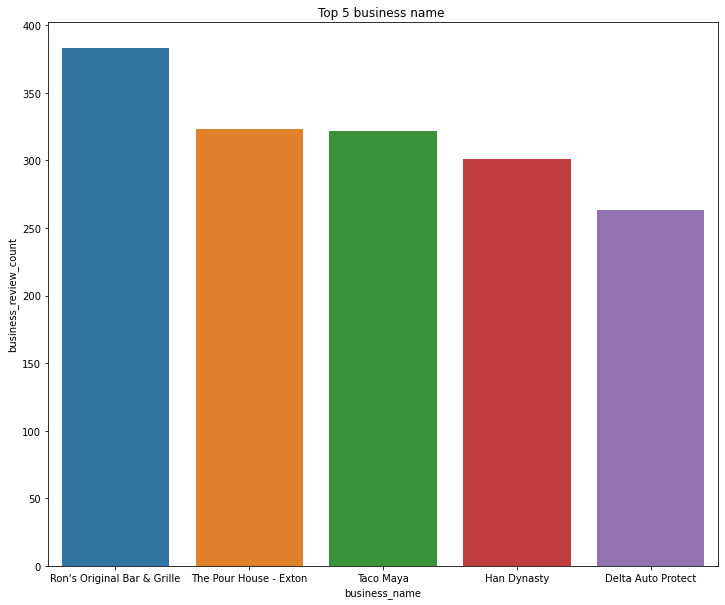

In [420]:
#plotting bar graph 
plt.figure(figsize=(12,10))
ax = sns.barplot(x=businessDataFrame.sort_values(by=['business_review_count'],ascending=False).head(5)['business_name'], y=businessDataFrame.sort_values(by=['business_review_count'],ascending=False).head(5)['business_review_count'])
ax.set(title='Top 5 business name ')
plt.savefig("Top 5 business name.png")

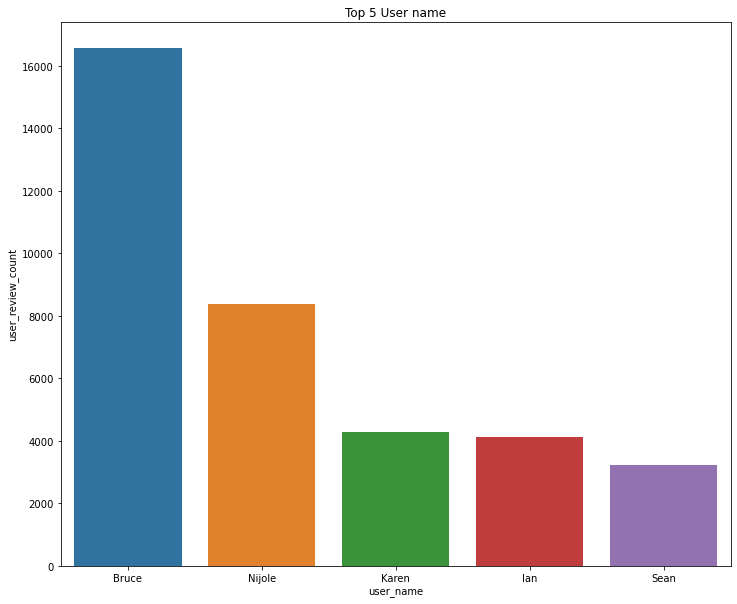

In [421]:
#plotting bar graph
plt.figure(figsize=(12,10))
ax = sns.barplot(x=userDataFrame.sort_values(by=['user_review_count'],ascending=False).head(5)['user_name'], y=userDataFrame.sort_values(by=['user_review_count'],ascending=False).head(5)['user_review_count'])
ax.set(title='Top 5 User name')
plt.savefig("Top 5 user name.png")

In [422]:
finalGraphDataFrame

,business_code,user_code,business_number,user_number,stars
0,b1,u112,1,1112,1.0
1,b1,u1132,1,2132,4.0
2,b1,u114,1,1114,3.0
3,b1,u1254,1,2254,1.0
4,b1,u1538,1,2538,1.0
...,...,...,...,...,...
13179,b415,ux,415,9156,0.0
13180,b416,ux,416,9156,0.0
13181,b417,ux,417,9156,0.0
13182,b418,ux,418,9156,0.0


In [423]:
Topbusinessrating=finalGraphDataFrame[['business_code','stars']].groupby('business_code').agg('mean')

In [424]:
#calculating the average rating for each business
Topbusinessrating['stars'].sort_values(ascending=False)

business_code
b67     4.791667
b333    4.687500
b95     4.649123
b373    4.615385
b204    4.571429
          ...   
b254    1.133333
b320    1.000000
b55     0.875000
b78     0.833333
b206    0.833333
Name: stars, Length: 419, dtype: float64

In [425]:
Topbusinessrating.sort_values(by='stars',ascending=False)

,stars
business_code,
b67,4.791667
b333,4.687500
b95,4.649123
b373,4.615385
b204,4.571429
...,...
b254,1.133333
b320,1.000000
b55,0.875000


In [426]:
#creating the graph using pandas_edge_list
G = nx.from_pandas_edgelist(finalGraphDataFrame,'user_code','business_code',edge_attr=True)

In [427]:
#adding the different colors for user_nodes and businees_nodes
colors=[]
for node in G:
    if node in finalGraphDataFrame['business_code'].values:
        colors.append("red")
    else:
        colors.append("yellow")

In [252]:
#drawing the graph for all the edges
nx.draw(G)
plt.figure(figsize=(150,150))
nx.draw(G,with_labels=False,
       node_color=colors,node_size=[v*100 for v in dict(G.degree()).values()],
       width=list(finalGraphDataFrame['stars']))
plt.savefig("graph_1.png")

In [428]:
finalGraphDataFrame[['user_number','business_number']].to_csv(r'C:\Users\MaraligaVenkateshAsh\Downloads\Project_2\Project_2_FOC/input.txt',header=None,index=None,sep=',')

In [429]:
userd_id_1 = list(finalGraphDataFrame['business_code'])
businees_id_1= list(finalGraphDataFrame['user_code'])
edgelist =  list(zip(userd_id, businees_id))

In [430]:
edgelist

[('b1', 'u112'),
 ('b1', 'u1132'),
 ('b1', 'u114'),
 ('b1', 'u1254'),
 ('b1', 'u1538'),
 ('b1', 'u1657'),
 ('b1', 'u1701'),
 ('b1', 'u178'),
 ('b1', 'u209'),
 ('b1', 'u260'),
 ('b1', 'u267'),
 ('b1', 'u33'),
 ('b1', 'u39'),
 ('b1', 'u419'),
 ('b1', 'u454'),
 ('b1', 'u486'),
 ('b1', 'u488'),
 ('b1', 'u548'),
 ('b1', 'u90'),
 ('b1', 'u951'),
 ('b10', 'u2067'),
 ('b10', 'u2910'),
 ('b10', 'u3102'),
 ('b10', 'u3299'),
 ('b10', 'u340'),
 ('b10', 'u861'),
 ('b100', 'u1031'),
 ('b100', 'u1300'),
 ('b100', 'u1441'),
 ('b100', 'u2054'),
 ('b100', 'u2332'),
 ('b100', 'u3921'),
 ('b100', 'u4182'),
 ('b100', 'u4367'),
 ('b100', 'u4379'),
 ('b100', 'u5237'),
 ('b100', 'u5319'),
 ('b100', 'u5387'),
 ('b100', 'u5529'),
 ('b100', 'u5731'),
 ('b100', 'u5752'),
 ('b100', 'u72'),
 ('b101', 'u2878'),
 ('b101', 'u5107'),
 ('b101', 'u5161'),
 ('b101', 'u5414'),
 ('b101', 'u5478'),
 ('b101', 'u5736'),
 ('b101', 'u5785'),
 ('b101', 'u5795'),
 ('b102', 'u1474'),
 ('b102', 'u1880'),
 ('b102', 'u3308'),
 ('b102'

In [125]:
import networkx as nx
from MLN import MLN
import os

def read_mln(directory_path):
    mln = MLN()
    path = directory_path
    for filename in os.listdir(path):
        if not filename.startswith('.'):
            with open(os.path.join(path, filename), 'r') as infile:
                layer = nx.Graph()
                for i, line in enumerate(infile):
                    line = line.strip('\n')
                    edgeInfo = line.split(",")
                    v1=int(edgeInfo[0])
                    v2=int(edgeInfo[1])
                    layer.add_node(v1)
                    layer.add_node(v2)
                    layer.add_edge(v1,v2)
                mln.add_layer(layer)

            infile.close()
    return mln


#used to read layers from RMAT generated format. requires the nodecount in the graph.
'''def read_PaRMAT_graphs(directory_path, nodecount):
    mln = mlnlib.MLN()
    path = directory_path
    for filename in os.listdir(path):
        if not filename.startswith('.'):
            with open(os.path.join(path, filename), 'r') as infile:
                layername = ""
                layer = nx.Graph()
                for i in range(nodecount):
                    layer.add_node(i)
                for i, line in enumerate(infile):
                    line = line.strip('\n')
                    edge = line.split("\t")
                    layer.add_edge(int(edge[0]), int(edge[1]))
                mln.add_layer(layer)
            infile.close()
    return mln'''


#writes the MLN to files. each file is created for the layers in the network.
def write_mln_to_file(mln, path):
    for i in range(0, mln.get_number_of_layers()):
        filename = "layer_" + (str(i))
        g = mln.get_nth_layer(i)
        path_to_file = os.path.join(path, filename)
        os.makedirs(os.path.dirname(path_to_file), exist_ok=True)
        with open(path_to_file, 'w') as file:
            file.write(filename)
            file.write("\n")
            file.write(str(g.number_of_nodes()))
            file.write("\n")
            file.write(str(g.number_of_edges()))
            file.write("\n")
            for i in g.nodes():
                file.write(str(i))
                file.write("\n")
            for e in g.edges:
                file.write(f"{e[0]},{e[1]},1.0")
                file.write("\n")
        file.close()

In [126]:
#author:Hamza Reza Pavel
#Datastructure to represent HoMLN using networkx undirectional graph.

import networkx as nx
import os

class MLN:

    def __init__(self):
        self.layers = []
        self.directory = os.getcwd()

    def get_all_layer(self):
        return self.layers

    def get_nth_layer(self, n):
        return self.layers[n]

    def add_layer(self, g):
        self.layers.append(g)

    def get_number_of_layers(self):
        return len(self.layers)

    def __aggregate_graph_AND(self, g1, g2):
        nodes = g1.nodes
        resultGraph = nx.Graph()
        resultGraph.add_nodes_from(nodes)
        edges_g1 = set([e for e in g1.edges])
        edges_g2 = set([e for e in g2.edges])
        common_edges = edges_g1.intersection(edges_g2)
        resultGraph.add_edges_from(common_edges)
        return resultGraph;

    def __aggregate_graph_OR(self, g1, g2):
        nodes = g1.nodes
        resultGraph = nx.Graph()
        resultGraph.add_nodes_from(nodes)
        edges_g1 = set([e for e in g1.edges])
        edges_g2 = set([e for e in g2.edges])
        output_edges = edges_g1.union(edges_g2)
        resultGraph.add_edges_from(output_edges)
        return resultGraph

    def get_aggregated_graph_AND(self):
        resultGraph = self.layers[0]
        for i in range(1, len(self.layers)):
            resultGraph = self.__aggregate_graph_AND(resultGraph, self.layers[i])
        return resultGraph;

    def get_aggregated_graph_OR(self):
        resultGraph = self.layers[0]
        for i in range(1, len(self.layers)):
            resultGraph = self.__aggregate_graph_OR(resultGraph, self.layers[i])

        return resultGraph;

Begin Network Summary


number of nodes of layer 0 : 8575
number of edges of layer 0: 13184
Number of Connected Component of layer 0   :1 
Density of layer 0  : 0.0003586407071075956
diameter of layer 0: 4
End network summary. Additional files are written in the same directory as the output file.


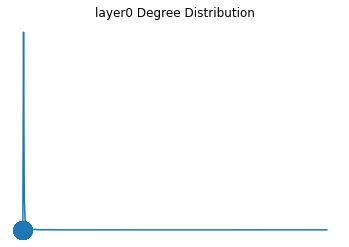

In [127]:
import networkx as nx
import MLN_IO as mlnio
import MLN as mlnlib
import statistics as stat
from collections import Counter
import csv
import matplotlib.pyplot as plt
import sys
import os


def plot_degree_histogram_v3(graph, layername, save_file_path):
    counts = Counter(d for n, d in graph.degree())
    degree_freq = [counts.get(i, 0) for i in range(max(counts) + 1)]
    #print(degree_freq)
    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.plot([k for k in range(0, len(degree_freq))], [v for v in degree_freq])
    #ax.set_yscale('log')
    #ax.set_xscale('log')
    plt.title(f"{layername} Degree Distribution")
    plt.xlabel('Degree')
    plt.ylabel('Number of nodes')
    #plt.show() # blocking function. commented out to stop interrupting the exeuction of code in batch mode.
    fig.savefig(save_file_path+"_"+layername+"_deg_dist"+".png")

def degree_statistics(graph):
    degrees = [v for k, v in graph.degree()]
    #print(degrees)
    minimum = min(degrees)
    maximum = max(degrees)
    avg = stat.mean(degrees)
    stdev = stat.stdev(degrees)
    return minimum, maximum, avg, stdev, degrees

def network_sum():
    #datasetpath = sys.argv[1]
    #output_path = sys.argv[2]
    datasetpath =r'C:\Users\MaraligaVenkateshAsh\Downloads\Project_2\Project_2_FOC'
    output_path = r'C:\Users\MaraligaVenkateshAsh\Downloads\Project_2\Project_2_FOC\output.txt'
    #mln = read_PaRMAT_graphs(datasetpath, number_of_nodes_per_layer)
    mln = mlnio.read_mln(datasetpath)

    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    with open(output_path, mode='w') as analysis_file:
            fieldnames = ['number_of_nodes', 'number_of_edges', 'density',
                          'number_of_connected_comp', 'connected_comps','diameter',
                          'min_degree','max_degree', 'avg_degree','std_dev_degree']
            writer = csv.DictWriter(analysis_file, fieldnames=fieldnames)
            writer.writeheader()

    print("Begin Network Summary\n\n")

    for i in range(mln.get_number_of_layers()):
        g1 = mln.get_nth_layer(i)
        number_of_nodes = g1.number_of_nodes()
        print(f"number of nodes of layer {i} : {number_of_nodes}")
        num_of_edges = g1.number_of_edges()
        print(f"number of edges of layer {i}: {num_of_edges}")
        connected_component_g1 = [len(c) for c in sorted(nx.connected_components(g1), key=len, reverse=True)]
        print(f"Number of Connected Component of layer {i}   :{len(connected_component_g1)} ")
        density_g1 = nx.density(g1)
        print(f"Density of layer {i}  : {density_g1}")

        diameter = -1
        if len(connected_component_g1) == 1:
            diameter = nx.diameter(g1)
            print(f"diameter of layer {i}: {diameter}") #diameter is only defined in nx if the whole graph is a singel connected component.

        #print([number_of_nodes, num_of_edges, density_g1, len(connected_component_g1)])
        plot_degree_histogram_v3(g1, f"layer{i}", output_path)

        minimum_deg_g1, maximum_deg_g1, avg_deg_g1, stdev_deg_g1, degrees_g1 = degree_statistics(g1)

        with open(output_path, mode='a') as analysis_file:
            fieldnames = ['number_of_nodes', 'number_of_edges', 'density',
                          'number_of_connected_comp', 'connected_comps','diameter',
                          'min_degree','max_degree', 'avg_degree','std_dev_degree']
            writer = csv.DictWriter(analysis_file, fieldnames=fieldnames)
            writer.writerow({'number_of_nodes':number_of_nodes, 'number_of_edges':num_of_edges, 'density':density_g1,
                          'number_of_connected_comp':len(connected_component_g1), 'connected_comps':connected_component_g1,'diameter': diameter,
                          'min_degree':minimum_deg_g1,'max_degree':maximum_deg_g1, 'avg_degree':avg_deg_g1,'std_dev_degree': stdev_deg_g1})

        print("End network summary. Additional files are written in the same directory as the output file.")
        nx.draw(g1)



if __name__ == '__main__':
    network_sum()


In [431]:
#Calculating the centrality for every node
degree_centrlity = nx.degree_centrality(G)

In [432]:
degree_centrlity

{'u112': 0.00011663167716351762,
 'b1': 0.00244926522043387,
 'u1132': 0.00011663167716351762,
 'u114': 0.00023326335432703523,
 'u1254': 0.0005831583858175881,
 'u1538': 0.00023326335432703523,
 'u1657': 0.00011663167716351762,
 'u1701': 0.00046652670865407047,
 'u178': 0.00023326335432703523,
 'u209': 0.00011663167716351762,
 'u260': 0.00046652670865407047,
 'u267': 0.00034989503149055286,
 'u33': 0.00023326335432703523,
 'u39': 0.00011663167716351762,
 'u419': 0.0008164217401446233,
 'u454': 0.0008164217401446233,
 'u486': 0.00034989503149055286,
 'u488': 0.00023326335432703523,
 'u548': 0.00023326335432703523,
 'u90': 0.0006997900629811057,
 'u951': 0.00023326335432703523,
 'u2067': 0.00011663167716351762,
 'b10': 0.0008164217401446233,
 'u2910': 0.00023326335432703523,
 'u3102': 0.00011663167716351762,
 'u3299': 0.00023326335432703523,
 'u340': 0.00023326335432703523,
 'u861': 0.00011663167716351762,
 'u1031': 0.00023326335432703523,
 'b100': 0.0019827385117797995,
 'u1300': 0.001

In [433]:
business_business_id = list(finalGraphDataFrame['business_code'])

In [434]:
user_user_id = list(finalGraphDataFrame['user_code'])

In [435]:
list1=[]
for i in range(0,419):
        list1.append(degree_centrlity[businessDataFrame['business_code'][i]])
list2 = []
for i in range(0,8156):
     list2.append(degree_centrlity[userDataFrame['user_code'][i]])

In [436]:
data = list(zip(list(businessDataFrame['business_code']),list1))
dataframe_centrality_business= pd.DataFrame(data, columns = ['business_id','degree_centrality_business_id'])

In [437]:
#degree of centrality for business_nodes
dataframe_centrality_business

,business_id,degree_centrality_business_id
0,b1,0.002449
1,b2,0.024376
2,b3,0.001400
3,b4,0.001050
4,b5,0.004549
...,...,...
414,b415,0.001516
415,b416,0.001166
416,b417,0.015395
417,b418,0.000933


In [438]:
dataframe_centrality_business.sort_values(by='degree_centrality_business_id',ascending=False).head(10)

,business_id,degree_centrality_business_id
19,b20,0.044787
85,b86,0.037789
215,b216,0.037672
36,b37,0.035223
339,b340,0.030791
194,b195,0.028925
1,b2,0.024376
325,b326,0.020411
93,b94,0.020294
413,b414,0.019244


In [439]:
data = list(zip(list(userDataFrame['user_code']),list2))
dataframe_centrality_user= pd.DataFrame(data, columns = ['user_id','degree_centrality_user_id'])

In [440]:
#degree of centrality for user_nodes
dataframe_centrality_user

,user_id,degree_centrality_user_id
0,u1,0.000117
1,u2,0.000117
2,u3,0.000350
3,u4,0.000117
4,u5,0.000117
...,...,...
8151,u8152,0.000117
8152,u8153,0.000117
8153,u8154,0.000117
8154,u8155,0.000117


In [441]:
dataframe_centrality_user.sort_values(by='degree_centrality_user_id',ascending=False).head(10)

,user_id,degree_centrality_user_id
8155,ux,0.048869
811,u812,0.004549
80,u81,0.003499
1110,u1111,0.003382
2752,u2753,0.003266
644,u645,0.003266
1573,u1574,0.003032
155,u156,0.002683
673,u674,0.002333
469,u470,0.002216


In [442]:
from networkx.algorithms.flow import edmonds_karp

In [443]:
#calculating the maximum flow for first 50 user_nodes and businees nodes
Max_flow = []
businees_id = []
user_id = []
for i in range(0,50):
    R= edmonds_karp(G,finalGraphDataFrame['user_code'][i],finalGraphDataFrame['business_code'][i],capacity='stars');
    Max = nx.maximum_flow(R,finalGraphDataFrame['user_code'][i],finalGraphDataFrame['business_code'][i]);
    Max_flow.append(Max[0])
    user_id.append(finalGraphDataFrame['user_code'][i])
    businees_id.append(finalGraphDataFrame['business_code'][i])
    

In [444]:
data = list(zip(user_id,businees_id,Max_flow))

In [445]:
dataframe_for_maxflow = pd.DataFrame(data, columns = ['user_id','business_id','Max_flow'])

In [446]:
#calculating the maximum flow for connected nodes
dataframe_for_maxflow.sort_values(by='Max_flow',ascending=False)

,user_id,business_id,Max_flow
13,u419,b1,26.0
18,u90,b1,23.0
27,u1300,b100,19.0
14,u454,b1,16.0
28,u1441,b100,14.0
15,u486,b1,14.0
9,u260,b1,13.0
3,u1254,b1,11.0
17,u548,b1,9.0
26,u1031,b100,9.0


In [447]:
user_code_3d = list(completeDataOfExton['user_number'])
business_code_3d = list(completeDataOfExton['business_number'])
stars = list(completeDataOfExton['stars'])

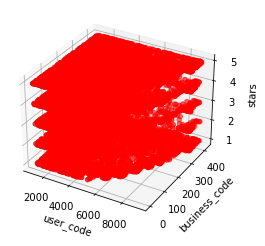

In [448]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt



fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

x = user_code_3d
y =  business_code_3d
z =stars



ax.scatter(x, y, z, c='r', marker='o')

ax.set_xlabel('user_code')
ax.set_ylabel('business_code')
ax.set_zlabel('stars')

plt.show()